In [36]:
import numpy as np
import pandas as pd
import scanpy as sc
from tqdm import tqdm
import seaborn as sns
import matplotlib as mpl
import archetypes as arch
from PIL import Image
import colorsys
import matplotlib.pyplot as plt
from scipy.stats import entropy
from scipy.stats import pearsonr
import sklearn.metrics as metrics
from scipy.spatial.distance import jensenshannon
from scipy.cluster.hierarchy import linkage, leaves_list
import json
from skimage import transform
from shapely import Point, Polygon

In [2]:
import os
import sys
module_path = os.path.abspath('/mnt/c/Users/demeter_turos/PycharmProjects/chrysalis')
if module_path not in sys.path:
    sys.path.append(module_path)

import chrysalis as ch

plt.rcParams['svg.fonttype'] = 'none'

data_path = '/mnt/c/Users/demeter_turos/PycharmProjects/chrysalis/data/xenium_human_breast_cancer/'

In [ ]:
adata = sc.read_visium(data_path + 'visium/')

sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pp.filter_cells(adata, min_counts=1000)
sc.pp.filter_genes(adata, min_cells=10)

sc.pl.spatial(adata, img_key="hires", color="total_counts", size=1.8, cmap='viridis', alpha=0.3)

ch.detect_svgs(adata, min_morans=0.05, min_spots=0.05)

adata.write(data_path + 'visium_sample.h5ad')

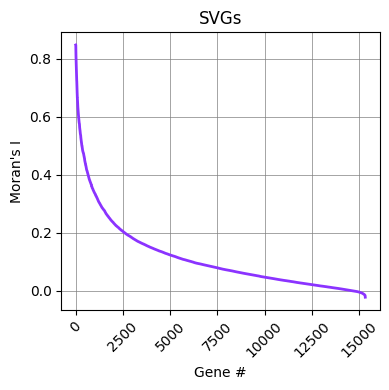

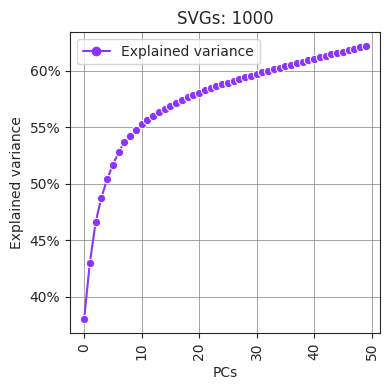

In [4]:
adata = sc.read_h5ad(data_path + 'visium_sample.h5ad')

ch.plot_svgs(adata)
plt.show()

sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

ch.pca(adata, n_pcs=50)

ch.plot_explained_variance(adata)
plt.show()

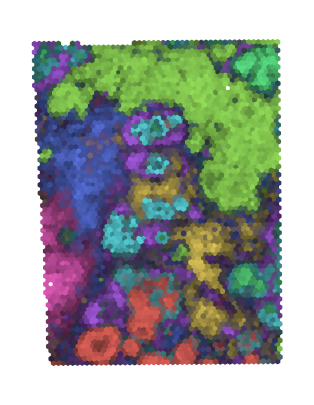

In [5]:
ch.aa(adata, n_pcs=20, n_archetypes=8)
ch.plot(adata, dim=8)
plt.show()

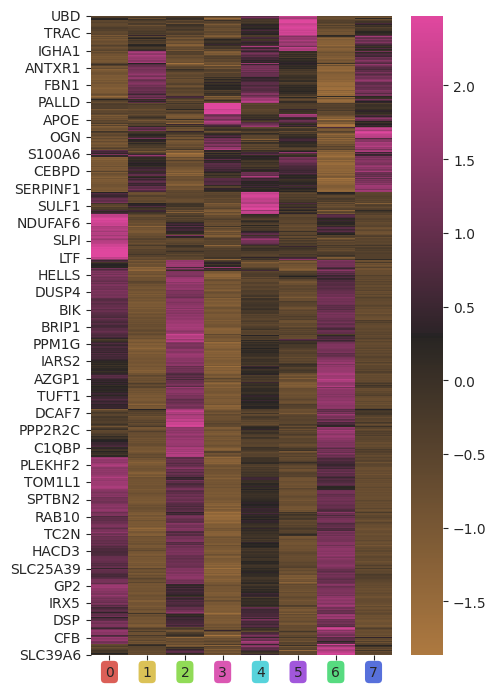

In [6]:
ch.plot_heatmap(adata)
plt.show()

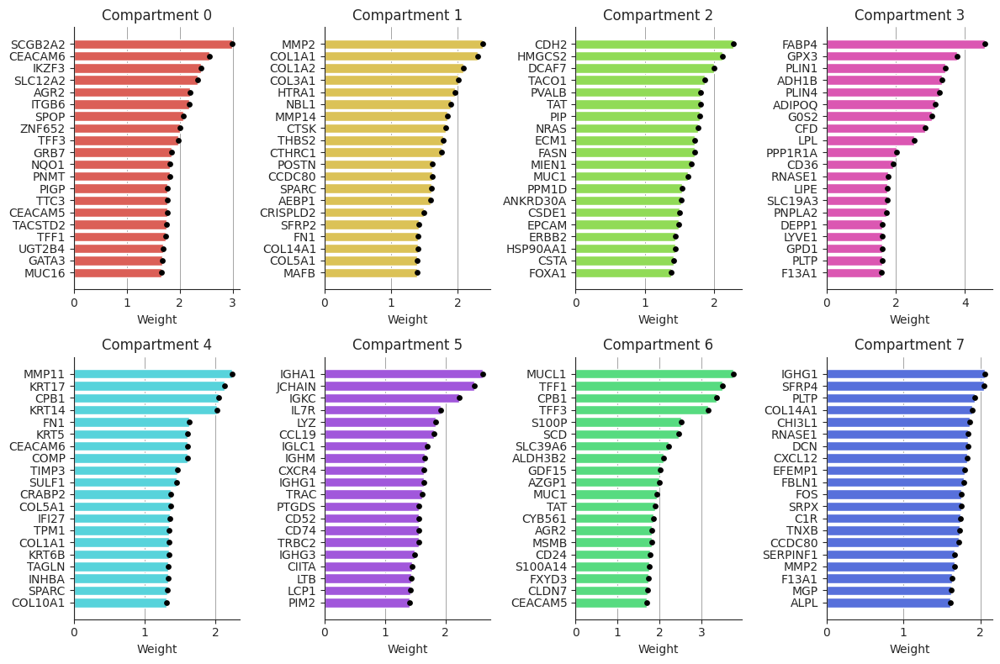

In [7]:
ch.plot_weights(adata)
plt.show()

In [29]:
# read Xenium data

ref_adata = sc.read_10x_h5(data_path + 'xenium/cell_feature_matrix.h5')
cells_df = pd.read_csv(data_path + 'xenium/cells.csv.gz', index_col=0)
cells_df.index = cells_df.index.astype(str)
ref_adata.obs[cells_df.columns] = cells_df
# cell types
annot_df = pd.read_csv(data_path + 'xenium/insitu_replicate_1_annotation.csv', index_col=0)

di = {'B_Cells': 'B cell', 'CD4+_T_Cells': 'CD4+ T cell', 'CD8+_T_Cells': 'CD8+ T cell', 'DCIS_1': 'DCIS #1',
      'DCIS_2': 'DCIS #2',
       'Endothelial': 'Endothelial cell', 'IRF7+_DCs': 'IRF7+ Dendritic cell', 'Invasive_Tumor': 'Invasive tumor',
      'LAMP3+_DCs': 'LAMP3+ Dendritic cell',
       'Macrophages_1': 'Macrophage #1', 'Macrophages_2': 'Macrophage #2', 'Mast_Cells': 'Mast cell',
      'Myoepi_ACTA2+': 'ACTA2+ Myoepithelial cell',
       'Myoepi_KRT15+': 'KRT15+ Myoepithelial cell', 'Perivascular-Like': 'Perivascular-like',
      'Prolif_Invasive_Tumor': 'Proliferative inv. tumor',
       'Stromal': 'Stromal cell', 'Stromal_&_T_Cell_Hybrid': 'Stromal & T cell',
      'T_Cell_&_Tumor_Hybrid': 'T cell & tumor',
       'Unlabeled': 'Unlabeled'}

annot_df['Cluster'] = annot_df['Cluster'].map(di)
annot_df.index = annot_df.index.astype(str)

ref_adata.obs['cell_type'] = annot_df['Cluster'].astype('category')

# cell positions do not match with the corresponding image unfortunately
im = Image.open(data_path + 'Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image_registered.tif')

xsf = im.size[0] / np.max(ref_adata.obs['x_centroid'])
ysf = im.size[1] / np.max(ref_adata.obs['y_centroid'])
ref_adata.obs['x_centroid'] = ref_adata.obs['x_centroid'] * xsf
ref_adata.obs['y_centroid'] = ref_adata.obs['y_centroid'] * ysf

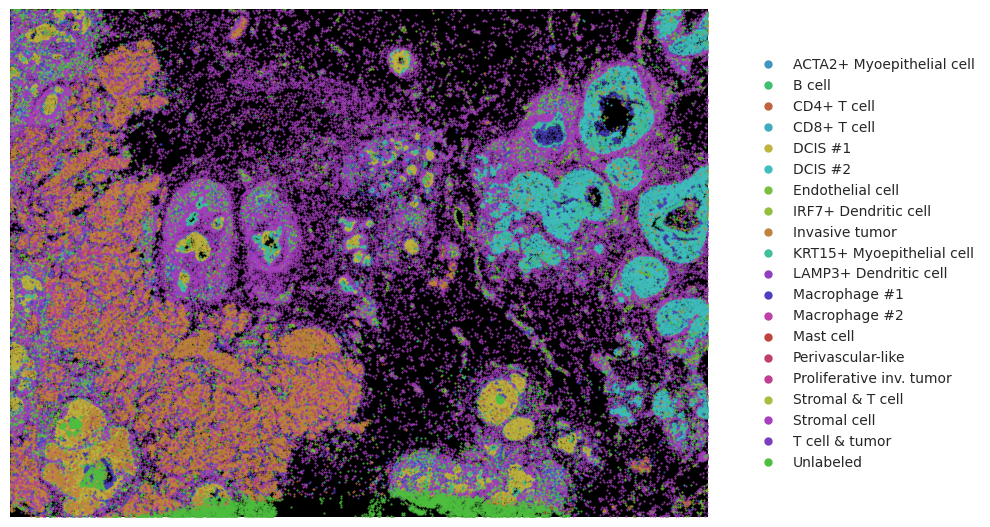

In [30]:
# plot cells
def generate_random_colors(num_colors, hue_range=(0, 1), saturation=0.5, lightness=0.5, min_distance=0.05, seed=None):
    colors = []
    hue_list = []
    if seed:
        np.random.seed(seed)
    else:
        np.random.seed(42)
    while len(colors) < num_colors:
        # generate a random hue value within the specified range
        hue = np.random.uniform(hue_range[0], hue_range[1])

        # check if the hue is far enough away from the previous hue
        if len(hue_list) == 0 or all(abs(hue - h) > min_distance for h in hue_list):
            hue_list.append(hue)
            saturation = saturation
            lightness = lightness
            rgb = colorsys.hls_to_rgb(hue, lightness, saturation)
            hex_code = '#{:02x}{:02x}{:02x}'.format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))
            colors.append(hex_code)

    return colors


ncolor = len(ref_adata.obs['cell_type'].cat.categories)
colors = generate_random_colors(ncolor, min_distance=1 / ncolor * 0.5, seed=63)

fig, ax = plt.subplots(1, 1, figsize=(10, 7))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'], s=0.9, c=colors[idx], marker='.', label=c, rasterized=True)
# ax.axis('off')
ax.set_facecolor('black')
for side in ['top', 'bottom', 'left', 'right']:
    ax.spines[side].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xlim(np.min(ref_adata.obs['x_centroid']), np.max(ref_adata.obs['x_centroid']))
ax.set_ylim(np.min(ref_adata.obs['y_centroid']), np.max(ref_adata.obs['y_centroid']))
ax.legend(loc='lower right', title='AUC')
handles, labels = ax.get_legend_handles_labels()
legend = ax.legend(handles, labels, loc='center right', bbox_to_anchor=(1.4, 0.5), frameon=False)
# Set the marker size
for handle in legend.legendHandles:
    handle.set_sizes([100])
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

In [31]:
adata = sc.read_visium(data_path + 'visium/')

with open(data_path + 'cytassist_alignment_vistocyt.json') as json_file:
    alignment_json = json.load(json_file)
vtc_trm = np.array(alignment_json['cytAssistInfo']['transformImages'])

with open(data_path + 'cytassist_alignment_xetocyt.json') as json_file:
    alignment_json = json.load(json_file)
xtc_trm = np.array(alignment_json['cytAssistInfo']['transformImages'])


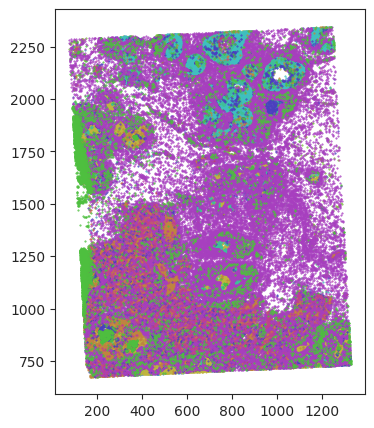

In [32]:
def transform_coordinates(coords, transform_matrix):
    # Add a column of ones to the coordinates to allow for the translation step
    coords = np.hstack((coords, np.ones((len(coords), 1))))

    # Multiply the coordinates by the matrix
    transformed_coords = np.dot(transform_matrix, coords.T).T

    # Divide by the last element of each row to account for the translation
    transformed_coords = transformed_coords[:, :2] / transformed_coords[:, 2:]

    return transformed_coords


# transform xenium to cytassist coordinate system
coords = ref_adata.obs[['x_centroid', 'y_centroid']].values
coords_t = transform_coordinates(coords, xtc_trm)
ref_adata.obs[['x_centroid', 'y_centroid']] = coords_t


fig, ax = plt.subplots(1, 1, figsize=(4, 5))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'], s=0.9, c=colors[idx], marker='.')
plt.show()

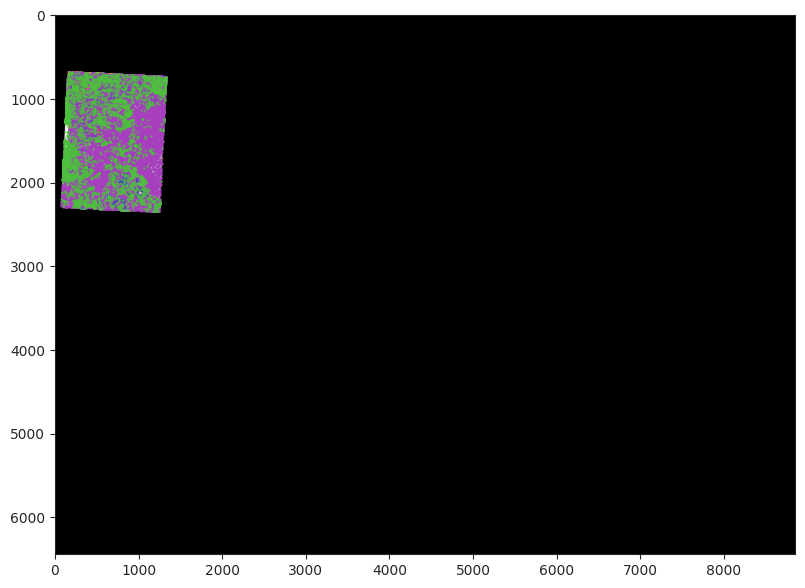

In [33]:
affine_inv = np.linalg.inv(xtc_trm)
tform = transform.AffineTransform(affine_inv)
tf_img = transform.warp(np.array(im), tform)

fig, ax = plt.subplots(1, 1, figsize=(10, 7))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'], s=0.9, c=colors[idx], marker='.')
plt.imshow(tf_img)
plt.show()

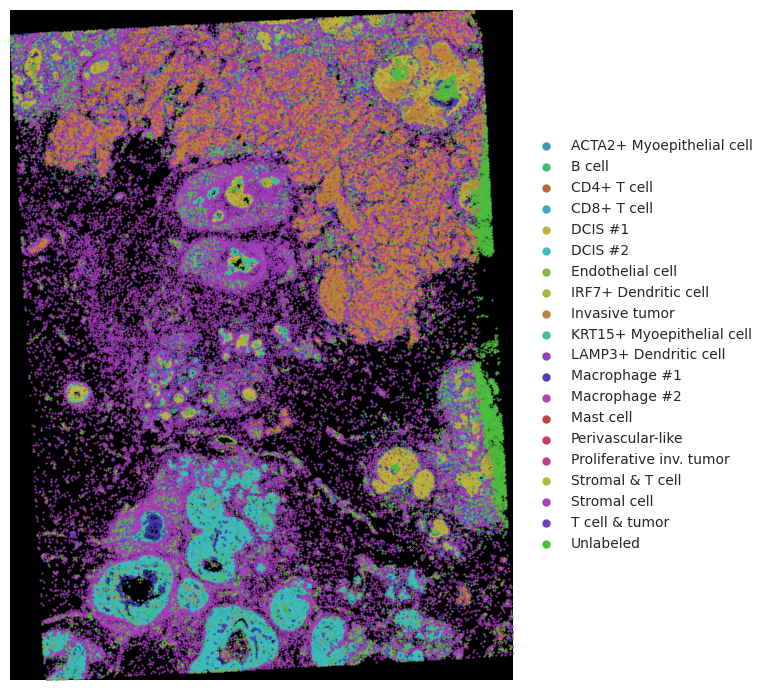

In [34]:
# transform xenium to cytassist coordinate system
coords_tt = transform_coordinates(coords_t, np.linalg.inv(vtc_trm))
ref_adata.obs[['x_centroid', 'y_centroid']] = coords_tt

scalef = adata.uns['spatial']['CytAssist_FFPE_Human_Breast_Cancer']['scalefactors']['tissue_hires_scalef']

ncolor = len(ref_adata.obs['cell_type'].cat.categories)
colors = generate_random_colors(ncolor, min_distance=1 / ncolor * 0.5, seed=63)

fig, ax = plt.subplots(1, 1, figsize=(10, 7))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'] * -1, s=0.9, c=colors[idx], marker='.', label=c)
# ax.axis('off')
ax.set_facecolor('black')
for side in ['top', 'bottom', 'left', 'right']:
    ax.spines[side].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xlim(np.min(ref_adata.obs['x_centroid']), np.max(ref_adata.obs['x_centroid']))
ax.set_ylim(np.min(ref_adata.obs['y_centroid'] * -1), np.max(ref_adata.obs['y_centroid'] * -1))
ax.legend(loc='lower right', title='AUC')
handles, labels = ax.get_legend_handles_labels()
legend = ax.legend(handles, labels, loc='center right', bbox_to_anchor=(1.5, 0.5), frameon=False)
# Set the marker size
for handle in legend.legendHandles:
    handle.set_sizes([100])
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

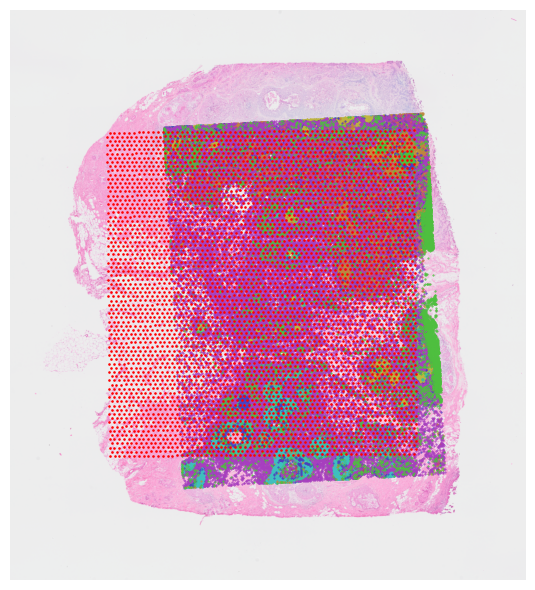

In [35]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'], s=0.9, c=colors[idx], marker='.')
ax.scatter(adata.obsm['spatial'][:, 0] * scalef, adata.obsm['spatial'][:, 1] * scalef, s=3, c='red', marker='.',)
ax.imshow(adata.uns['spatial']['CytAssist_FFPE_Human_Breast_Cancer']['images']['hires'])
# x, y = box.exterior.xy
# ax.plot(x, y)

# ax.axis('off')
ax.set_facecolor('black')
for side in ['top', 'bottom', 'left', 'right']:
    ax.spines[side].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])
plt.tight_layout()
plt.show()

In [ ]:
r = adata.uns['spatial']['CytAssist_FFPE_Human_Breast_Cancer']['scalefactors']['spot_diameter_fullres'] * scalef / 2

points = [Point(x, y) for x, y in zip(ref_adata.obs['x_centroid'], ref_adata.obs['y_centroid'])]

im_coords = np.array([[0, 0], [0, im.size[1]], [im.size[0], im.size[1]], [im.size[0], 0],])
im_coords_t = transform_coordinates(im_coords, xtc_trm)
im_coords_tt = transform_coordinates(im_coords_t, np.linalg.inv(vtc_trm))
box = Polygon(im_coords_tt)

spots = {}
for idx, xy in zip(adata.obs.index, adata.obsm['spatial']):
    xy = xy * scalef
    p = Point(xy[0], xy[1]).buffer(r)
    spots[idx] = p

in_xenium = {}
for bc in adata.obs.index:
    if box.contains(spots[bc]):
        in_xenium[bc] = True
    else:
        in_xenium[bc] = False
in_xenium_df = pd.DataFrame(in_xenium.values(), index=in_xenium.keys(), columns=['in_xenium'])
in_xenium_df.to_csv(data_path + 'in_xenium.csv')

spot_points = {}
for idx, point in tqdm(enumerate(points), total=len(points)):
    for label, spot in spots.items():
        if spot.contains(point):
            spot_points[idx] = label
            break
        else:
            spot_points[idx] = 'outside'
spot_points_df = pd.DataFrame(spot_points.values(), index=spot_points.keys())

spot_points_df.to_csv(data_path + 'cells_in_spot.csv')

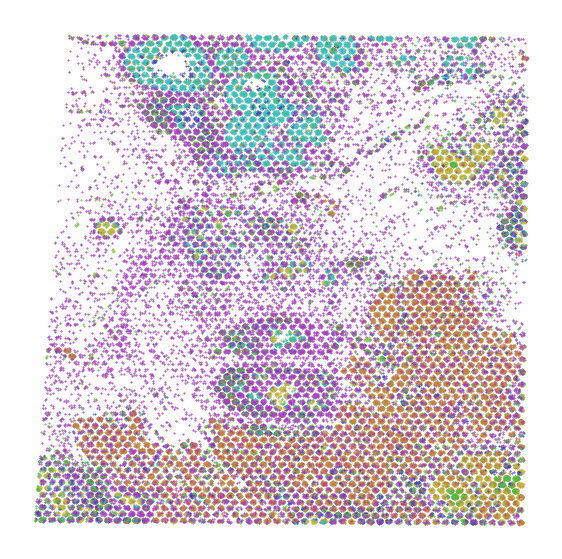

In [37]:
spot_points_df = pd.read_csv(data_path + 'cells_in_spot.csv', index_col=0)
spot_points_df.index = (spot_points_df.index + 1).astype(str)
ref_adata.obs['spot'] = spot_points_df

ref_adata = ref_adata[ref_adata.obs['spot'] != 'outside']

fig, ax = plt.subplots(1, 1, figsize=(7, 7))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'], s=0.9, c=colors[idx], marker='.')
ax.axis('off')
plt.show()

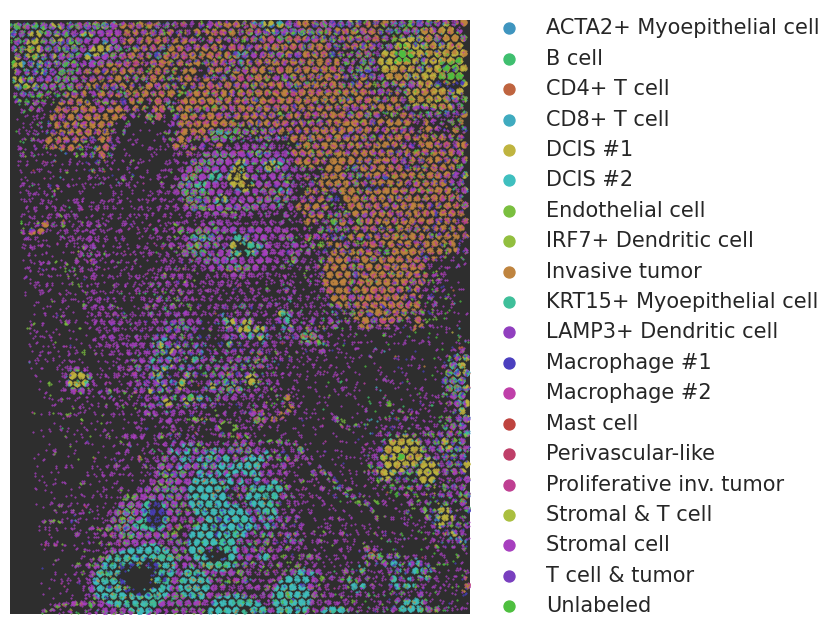

In [38]:
colors = generate_random_colors(ncolor, min_distance=1 / ncolor * 0.5, seed=63)  #68, 50

fig, ax = plt.subplots(1, 1, figsize=(14, 7))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ax.scatter(ctdf['x_centroid'], ctdf['y_centroid'] * -1, s=0.9, c=colors[idx], marker='.', label=c)
# ax.axis('off')
ax.set_facecolor('#2e2e2e')
for side in ['top', 'bottom', 'left', 'right']:
    ax.spines[side].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xlim(np.min(ref_adata.obs['x_centroid']), np.max(ref_adata.obs['x_centroid']))
ax.set_ylim(np.min(ref_adata.obs['y_centroid'] * -1), np.max(ref_adata.obs['y_centroid'] * -1))
ax.legend(loc='lower right', title='AUC')
handles, labels = ax.get_legend_handles_labels()
legend = ax.legend(handles, labels, loc='center right', bbox_to_anchor=(1.8, 0.5), frameon=False, fontsize=15)
# Set the marker size
for handle in legend.legendHandles:
    handle.set_sizes([250])
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

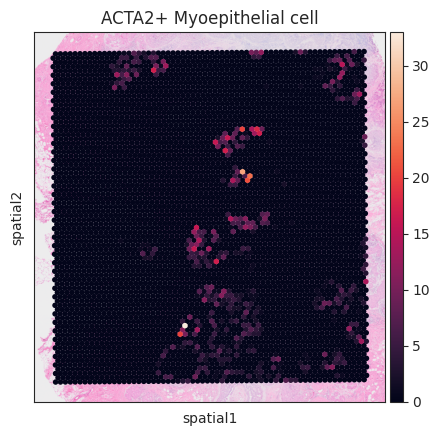

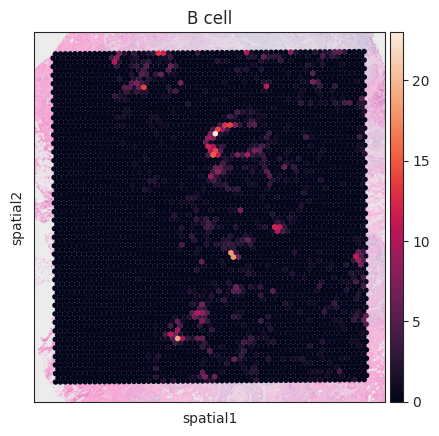

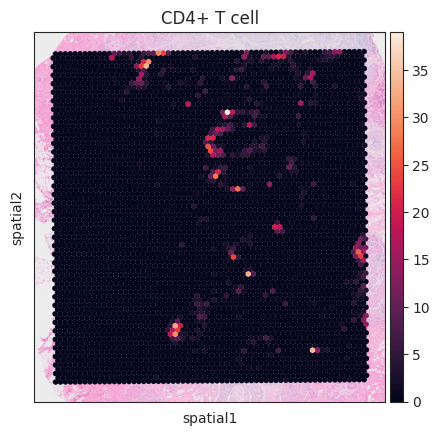

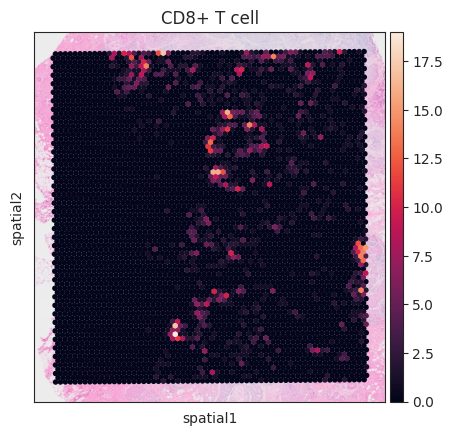

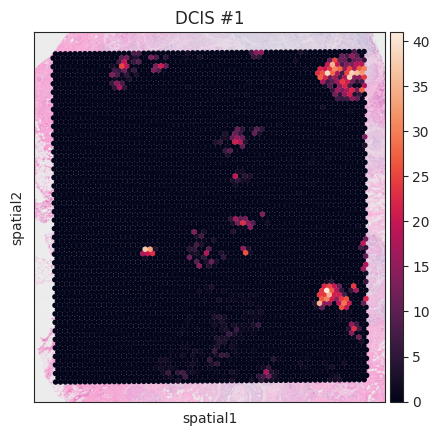

...

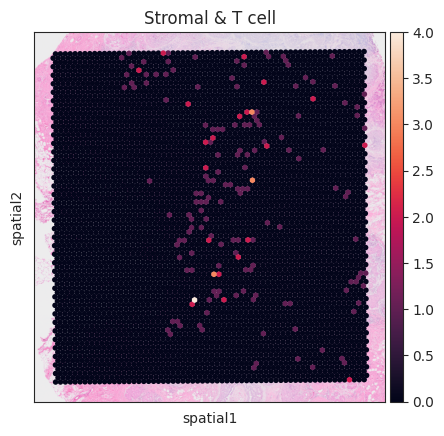

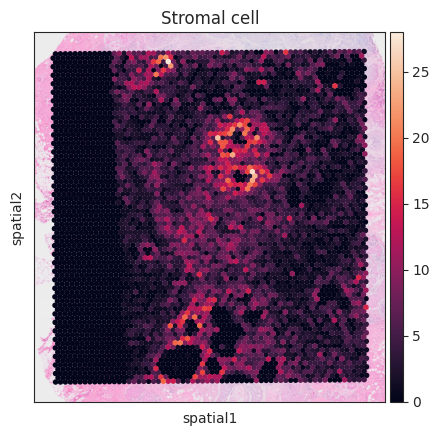

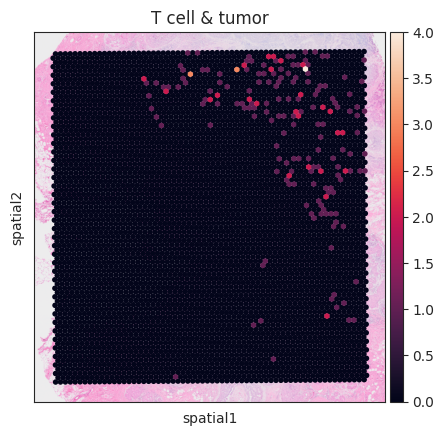

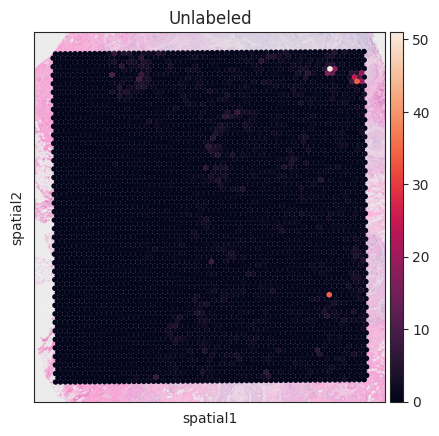

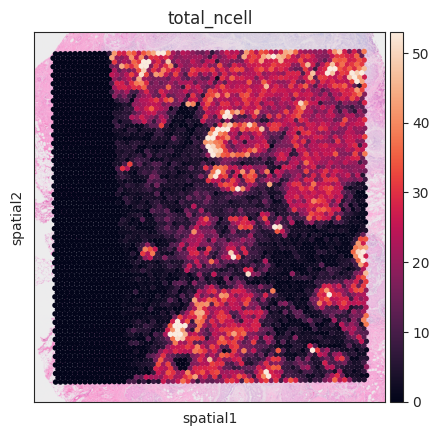

In [39]:
cell_type_df = pd.DataFrame(index=adata.obs.index, columns=np.unique(ref_adata.obs['cell_type']))
for idx, c in enumerate(np.unique(ref_adata.obs['cell_type'])):
    ctdf = ref_adata.obs[ref_adata.obs['cell_type'] == c]
    ncells = ctdf['spot'].value_counts()
    cell_type_df[c] = ncells
cell_type_df = cell_type_df.fillna(0)
cell_type_df = cell_type_df.astype(int)

# cell_type_df.to_csv(data_path + 'cell_type_abundance.csv')

for c in cell_type_df.columns:
    adata.obs[c] = cell_type_df[c]
    sc.pl.spatial(adata, color=c, size=1.6)

adata.obs['total_ncell'] = cell_type_df.sum(axis=1)
sc.pl.spatial(adata, color='total_ncell', size=1.6, vmax='p99.2')

In [41]:
adata = sc.read_h5ad(data_path + 'visium_sample.h5ad')

sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

ch.pca(adata, n_pcs=50)
ch.aa(adata, n_pcs=20, n_archetypes=8)

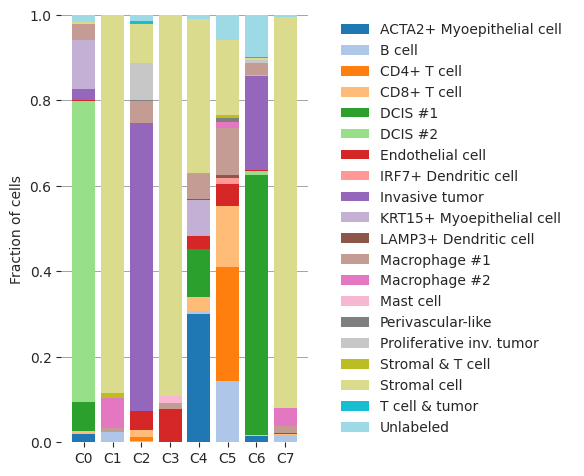

In [42]:
# cell types in the compartments

adata.obs = adata.obs.rename(columns=di)

long_df = pd.DataFrame()
alphas = adata.obsm['chr_aa']

n_comp = alphas.shape[1]

cell_type_props_df = pd.DataFrame(columns=cell_type_df.columns, index=[f'C{x}' for x in range(n_comp)])

ncolor = len(cell_type_props_df.columns)
colors = generate_random_colors(ncolor, min_distance=1 / ncolor * 0.5, seed=68)

for i in range(n_comp):
    adata.obs['comp'] = [1 if x > 0.80 else 0 for x in alphas[:, i]]
    cdf = adata.obs[adata.obs['comp'] == 1]
    cdf = cdf[cell_type_df.columns]

    cell_type_props = cdf.sum(axis=0) / cdf.values.sum()
    cell_type_props = np.array(cell_type_props)
    cell_type_props_df.iloc[i, :] = cell_type_props
    long_df = long_df.append(cdf, ignore_index=True)

cell_type_props_df = cell_type_props_df.reindex(sorted(cell_type_props_df.columns), axis=1)

colors = sns.color_palette("tab20", n_colors=ncolor)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 5))
# Plot data on the first subplot (ax1)
bottom = 0
for idx, name in enumerate(cell_type_props_df.columns.tolist()):
    ax1.bar(cell_type_props_df.index, cell_type_props_df[name], bottom=bottom, edgecolor='none',
            linewidth=0, color=colors[idx], label=name)
    bottom = bottom + cell_type_props_df[name]
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.grid(axis='both', linestyle='-', linewidth='0.5', color='grey')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0)
ax1.set_ylabel('Fraction of cells')
# Hide the x and y axis labels for ax2
ax2.set_xticks([])
ax2.set_yticks([])
ax2.axis('off')
# Create a new legend for ax2 and add it manually
ax2.legend(*ax1.get_legend_handles_labels(), loc='center', frameon=False)
plt.subplots_adjust(wspace=0.1)
plt.tight_layout()
plt.show()

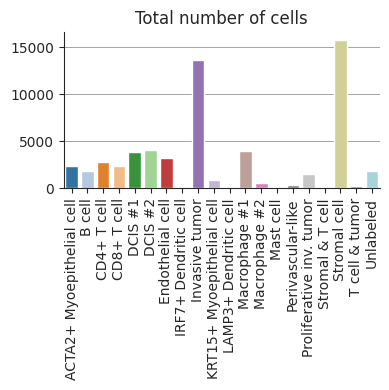

In [43]:
# cell n barplot
ncell_df = pd.DataFrame(cell_type_df.sum().rename('N (cell)')).T
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sns.barplot(ncell_df, palette=colors, ax=ax, )
ax.grid(axis='y', linestyle='-', linewidth='0.5', color='grey')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.set_title('Total number of cells')
plt.tight_layout()
plt.show()

In [44]:
di = {'B_Cells': 'B cell', 'CD4+_T_Cells': 'CD4+ T cell', 'CD8+_T_Cells': 'CD8+ T cell', 'DCIS_1': 'DCIS #1',
      'DCIS_2': 'DCIS #2',
       'Endothelial': 'Endothelial cell', 'IRF7+_DCs': 'IRF7+ Dendritic cell', 'Invasive_Tumor': 'Invasive tumor',
      'LAMP3+_DCs': 'LAMP3+ Dendritic cell',
       'Macrophages_1': 'Macrophage #1', 'Macrophages_2': 'Macrophage #2', 'Mast_Cells': 'Mast cell',
      'Myoepi_ACTA2+': 'ACTA2+ Myoepithelial cell',
       'Myoepi_KRT15+': 'KRT15+ Myoepithelial cell', 'Perivascular-Like': 'Perivascular-like',
      'Prolif_Invasive_Tumor': 'Proliferative inv. tumor',
       'Stromal': 'Stromal cell', 'Stromal_&_T_Cell_Hybrid': 'Stromal & T cell',
      'T_Cell_&_Tumor_Hybrid': 'T cell & tumor',
       'Unlabeled': 'Unlabeled'}

cell_type_df = pd.read_csv(data_path + 'cell_type_abundance.csv', index_col=0)
cell_type_df = cell_type_df.rename(columns=di)


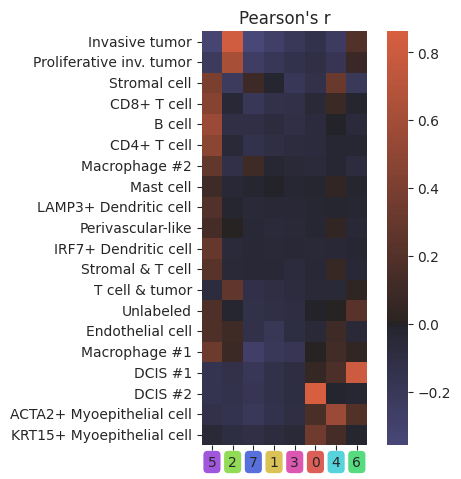

In [45]:
hexcodes = ['#db5f57', '#dbc257', '#91db57', '#57db80', '#57d3db', '#5770db', '#a157db', '#db57b2']
np.random.seed(len(adata))
np.random.shuffle(hexcodes)
cell_type_df = cell_type_df[cell_type_df.index.isin(adata.obs.index)]
compartment_df = pd.DataFrame(data=adata.obsm['chr_aa'],
                              index=adata.obs_names,
                              columns=range(adata.obsm['chr_aa'].shape[1]))

corr_matrix = np.empty((len(cell_type_df.columns), len(compartment_df.columns)))
for i, col1 in enumerate(cell_type_df.columns):
    for j, col2 in enumerate(compartment_df.columns):
        corr, _ = pearsonr(cell_type_df[col1], compartment_df[col2])
        corr_matrix[i, j] = corr

corr_df = pd.DataFrame(data=corr_matrix, index=cell_type_df.columns, columns=compartment_df.columns)

# corr matrix
Z = linkage(corr_df.T, method='ward')
order = leaves_list(Z)
corr_df = corr_df.iloc[:, order]
hexreord =  [hexcodes[i] for i in order]

Z = linkage(corr_df, method='ward')
order = leaves_list(Z)
corr_m = corr_df.iloc[order, :]

fig, ax = plt.subplots(1, 1, figsize=(6*0.8, 7*0.7))
sns.heatmap(corr_m, ax=ax, cmap=sns.diverging_palette(267, 20, l=55, center="dark", as_cmap=True),
            center=0, square=True, rasterized=True)
for idx, t in enumerate(ax.get_xticklabels()):
    t.set_bbox(dict(facecolor=hexreord[idx], alpha=1, edgecolor='none', boxstyle='round'))
plt.title("Pearson's r")
plt.tight_layout()
# plt.savefig('/mnt/c/Bern/Docs/chrysalis/figs/svgs/fig_2_xenium_correlation_matrix.svg')
plt.show()

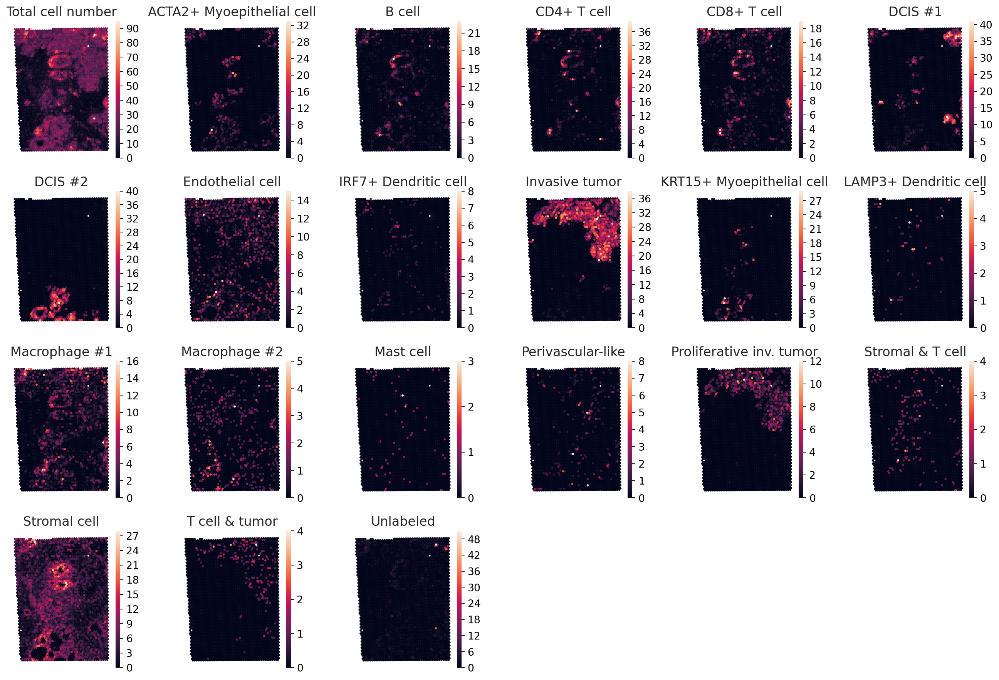

In [50]:
adata.obs['N (Cells)'] = cell_type_df.sum(axis=1)
adata.obs['Total cell number'] = cell_type_df.sum(axis=1)


cells = list(di.values())
cells.sort()

sc.set_figure_params(vector_friendly=True, dpi_save=300, fontsize=12)
fig, axs = plt.subplots(4, 6, figsize=(24*0.7, 16*0.7))
axs = axs.flatten()
for a in axs:
    a.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=-0.3, left=0.05, right=0.95, top=0.95, bottom=0.05)
for idx, c in enumerate(['Total cell number'] + cells):
    sc.pl.spatial(adata, cmap='rocket',
                  color=c, alpha_img=0,
                  ncols=4, size=1.7,
                  img_key='hires',
                  vmin=0, ax=axs[idx], show=False
                  )
    axs[idx].set_title(f'{c}', fontsize=15)
    cbar = fig.axes[-1]
    cbar.set_frame_on(False)
    cbar.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.tight_layout()
# plt.savefig('/mnt/c/Bern/Docs/chrysalis/figs/svgs/fig_2_xenium_cell_type_abundances.svg')
plt.show()

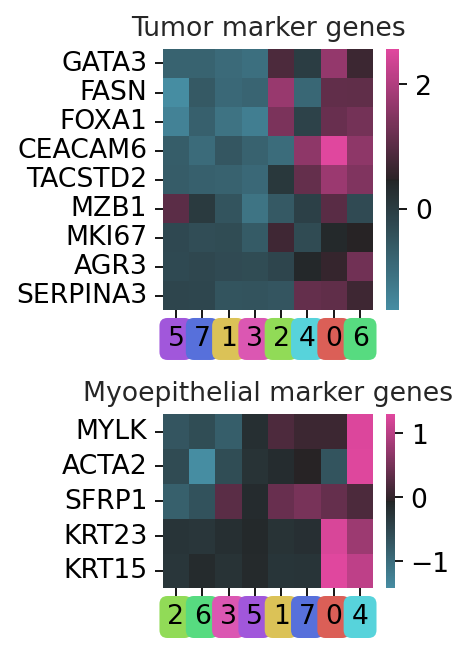

In [52]:
df = ch.get_compartment_df(adata)
df = df.rename(columns={x: x.split('_')[-1] for x in df.columns}).T

# df = df.apply(lambda x: (x - x.mean()) / x.std(), axis=0)

dim = df.shape[0]

# define compartment colors

hexcodes = ['#db5f57', '#dbc257', '#91db57', '#57db80', '#57d3db', '#5770db', '#a157db', '#db57b2']
np.random.seed(len(adata))
np.random.shuffle(hexcodes)
# cancer genes
genes = ['FASN', 'FOXA1', 'CEACAM6', 'GATA3', 'MZB1', 'AGR3', 'SERPINA3', 'TACSTD2', 'ABC11', 'MKI67']
genes = [x for x in genes if x in df.columns]
tdf = df[genes]

z = linkage(tdf.T, method='ward')
order = leaves_list(z)
tdf = tdf.iloc[:, order]

Z = linkage(tdf, method='ward')
order = leaves_list(Z)
tdf = tdf.iloc[order, :]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5*0.6, 7*0.6), gridspec_kw={'height_ratios': [3, 2]})
sns.heatmap(tdf.T, ax=ax1, cmap=sns.diverging_palette(220, 340, l=55, center="dark", as_cmap=True), square=False,
            rasterized=True)
for idx, t in enumerate(ax1.get_xticklabels()):
    t.set_bbox(dict(facecolor=hexcodes[order[idx]], alpha=1, edgecolor='none', boxstyle='round'))
ax1.set_title('Tumor marker genes')

# myoepithelial genes
genes = ['KRT23', 'ALDH1A3', 'SFRP1', 'KRT15', 'MYLK', 'ACTA2']
genes = [x for x in genes if x in df.columns]
mdf = df[genes]

z = linkage(mdf.T, method='ward')
order = leaves_list(z)
mdf = mdf.iloc[:, order]

Z = linkage(mdf, method='ward')
order = leaves_list(Z)
mdf = mdf.iloc[order, :]

sns.heatmap(mdf.T, ax=ax2, cmap=sns.diverging_palette(220, 340, l=55, center="dark", as_cmap=True), square=False,
            rasterized=True)
for idx, t in enumerate(ax2.get_xticklabels()):
    t.set_bbox(dict(facecolor=hexcodes[order[idx]], alpha=1, edgecolor='none', boxstyle='round'))
ax2.set_title('Myoepithelial marker genes')
plt.tight_layout()
plt.show()